# Telematics Data Analysis for Vehicle Insurance
**Problem Statement:**
The insurance industry is increasingly leveraging telematics data to assess risk, personalize policies, and improve claim processes. Telematics data, collected via IoT-enabled devices in vehicles, provides insights into driving behavior, vehicle usage, and external conditions. This project aims to analyze such telematics data to predict vehicle insurance risks and costs by employing big data analytics. The project will focus on the following components:

1. **Data Generation:** 
   - **Simulate or collect real telematics data**, which could include:
     - Vehicle speed
     - Braking patterns
     - Acceleration and deceleration events
     - GPS location (e.g., route tracking)
     - Time of day and weather conditions during the trip
     - Mileage and duration of trips
     - Events such as sharp turns, sudden stops, or collisions.
   - You could also incorporate external factors like traffic patterns or road conditions to enrich your dataset.
   - **Dashboard for Data Generation**: Create a real-time dashboard displaying key telematics data as it is being generated, providing live insights into driver behavior and vehicle metrics.

2. **Visualization:**
   - **Visualize the collected data** through meaningful charts and graphs:
     - Show trends in driving behavior (e.g., how often a driver speeds or brakes suddenly).
     - Map-based visualizations of routes driven, pinpointing risky areas.
     - Time-based charts to show driving patterns during different times of the day.
     - Pie charts or histograms representing risk categories (e.g., aggressive drivers vs. cautious drivers).
   - **Interactive Dashboard for Visualization**: Develop a user-friendly dashboard for insurance agents, where they can explore telematics data, view high-risk driving behaviors, and correlate these with potential insurance claims or policy costs.

3. **Model (Training and Prediction):**
   - **Risk Prediction Model**: Train a model that uses the telematics data to predict:
     - Probability of an accident or risky event occurring based on driver behavior.
     - Customized insurance premium calculations based on risk levels.
   - **Machine Learning Algorithms**:
     - Use classification models (e.g., Logistic Regression, Decision Trees, or Random Forest) to predict whether a driver falls into high, medium, or low-risk categories.
     - Use regression models to predict insurance premium adjustments based on the driver’s telematics data.
     - For unsupervised learning, clustering algorithms like K-means can categorize drivers based on behavior patterns.
   
4. **Evaluation:**
   - **Big Data Streaming**: Use **Apache Kafka** to simulate a real-time stream of telematics data coming from vehicles.
     - Process this streaming data with **Apache Spark** to feed it into your machine learning model in real-time for on-the-fly predictions.
     - Compare batch processing versus real-time streaming to measure the efficiency of processing and predicting risks.
   - **Model Evaluation Metrics**: Evaluate the model based on:
     - Accuracy in predicting risk categories.
     - Precision/Recall metrics for high-risk drivers.
     - Real-time system performance (e.g., latency of predictions).
     - Data ingestion rate and how well the system scales as the volume of telematics data increases.


In [1]:
!pip install pyspark

  Using cached pyspark-3.5.3-py2.py3-none-any.whl


In [2]:
!pip install kafka-python


In [3]:
from pyspark.sql import SparkSession

# Create a Spark session
spark = SparkSession.builder \
    .appName("TelematicsData") \
    .getOrCreate()


your 131072x1 screen size is bogus. expect trouble
24/11/03 13:41:05 WARN Utils: Your hostname, HIMANSHU resolves to a loopback address: 127.0.1.1; using 10.255.255.254 instead (on interface lo)
24/11/03 13:41:05 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/11/03 13:41:05 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [4]:
!pip install numpy pandas scipy matplotlib seaborn

  Using cached pandas-2.2.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (89 kB)
  Using cached scipy-1.14.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached pytz-2024.2-py2.py3-none-any.whl.metadata (22 kB)
  Using cached tzdata-2024.2-py2.py3-none-any.whl.metadata (1.4 kB)
  Using cached contourpy-1.3.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.4 kB)
  Using cached pillow-11.0.0-cp310-cp310-manylinux_2_28_x86_64.whl.metadata (9.1 kB)
  Using cached pyparsing-3.2.0-py3-none-any.whl.metadata (5.0 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 3.4 MB/s eta 0:00:0000:0100:01
Using cached pandas-2.2.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.1 MB)
Using cached scipy-1.14.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (41.2 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 3.1 MB/s eta 0:00:00a 0:00:01
Using cached contourpy-1.3.0-cp310-cp

In [5]:
import numpy as np
import pandas as pd
from scipy.stats import gamma, poisson, beta, uniform, truncnorm
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

In [6]:
def plot_feature(data, title, bins=30):
    plt.figure(figsize=(8, 4))
    sns.histplot(data, bins=bins, kde=True)
    plt.title(title)
    plt.show()


In [7]:
# Set seed for reproducibility
np.random.seed(42)

# Number of samples to generate
n_samples = 10000

# 1. Timestamp - Random dates in 2024
timestamps = pd.date_range(start='2024-01-01', end='2024-12-31', freq='D')
timestamps = np.random.choice(timestamps, n_samples)
timestamps

array(['2024-04-12T00:00:00.000000000', '2024-12-14T00:00:00.000000000',
       '2024-09-27T00:00:00.000000000', ...,
       '2024-09-07T00:00:00.000000000', '2024-01-09T00:00:00.000000000',
       '2024-01-13T00:00:00.000000000'], dtype='datetime64[ns]')

In [8]:
# 2. DriverID - Unique IDs
driver_ids = np.arange(1, n_samples + 1)
driver_ids

array([    1,     2,     3, ...,  9998,  9999, 10000])

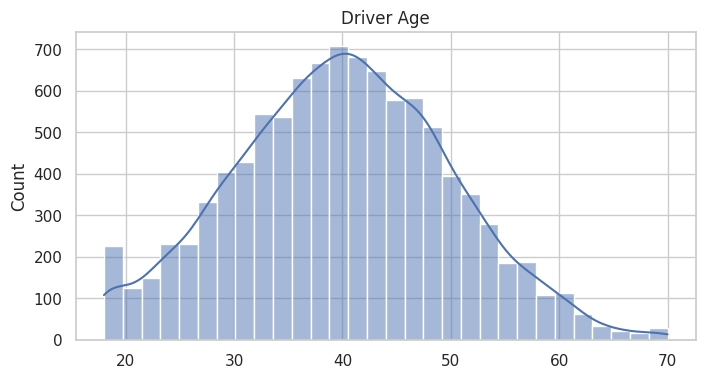

In [9]:
# 3. Driver Age (18-70 years)
driver_ages = np.clip(np.random.normal(40, 10, n_samples), 18, 70)
plot_feature(driver_ages, 'Driver Age', bins=30)

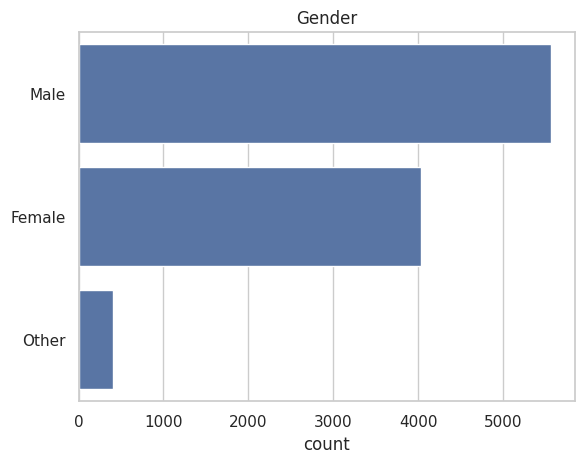

In [10]:
genders = np.random.choice(['Male', 'Female', 'Other'], n_samples, p=[0.56, 0.40, 0.04])
sns.countplot(y=genders)
plt.title('Gender')
plt.show()

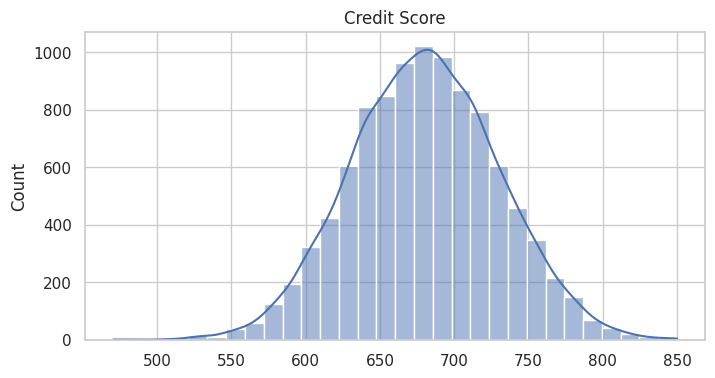

In [11]:
# 5. Credit Score (300-850)
credit_scores = np.clip(np.random.normal(680, 50, n_samples), 300, 850)
plot_feature(credit_scores, 'Credit Score', bins=30)

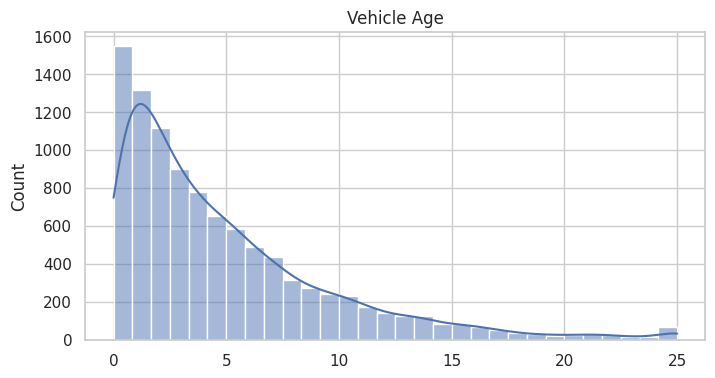

In [12]:

scale_factor = 5  # Adjust this to control how quickly the distribution decays
vehicle_ages = np.random.exponential(scale=scale_factor, size=n_samples)
vehicle_ages = np.clip(vehicle_ages, 0, 25)  # Clip at 25 to match the plot's range

# Call the modified plot function for vehicle age
plot_feature(vehicle_ages, 'Vehicle Age', bins=30)

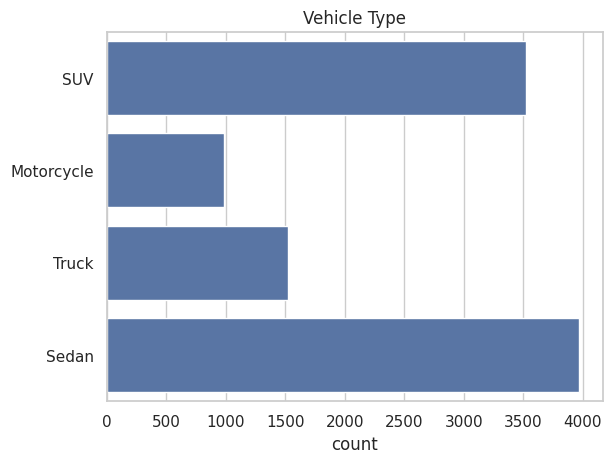

In [13]:
# 7. Vehicle Type
vehicle_types = np.random.choice(['Sedan', 'SUV', 'Truck', 'Motorcycle'], n_samples, p=[0.4, 0.35, 0.15, 0.1])
sns.countplot(y=vehicle_types)
plt.title('Vehicle Type')
plt.show()

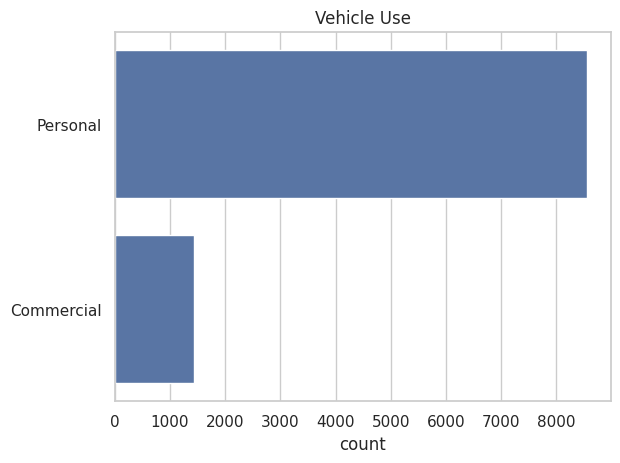

In [ ]:
# 8. Vehicle Use
vehicle_use = np.random.choice(['Personal', 'Commercial'], n_samples, p=[0.85, 0.15])
sns.countplot(y=vehicle_use)
plt.title('Vehicle Use')
plt.show()


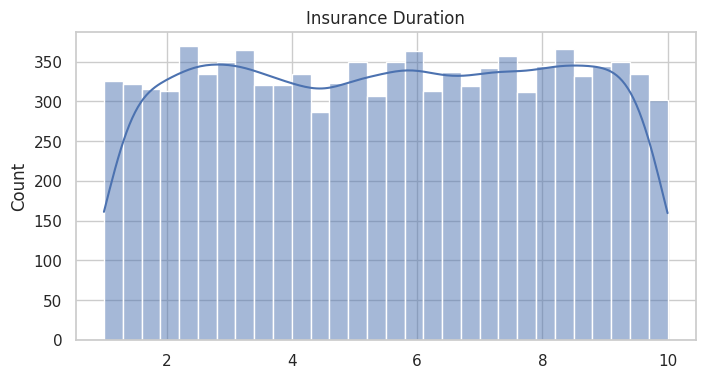

In [15]:
# 9. Insurance Duration (1-10 years)
insurance_duration = np.random.uniform(1, 10, n_samples)
plot_feature(insurance_duration, 'Insurance Duration', bins=30)

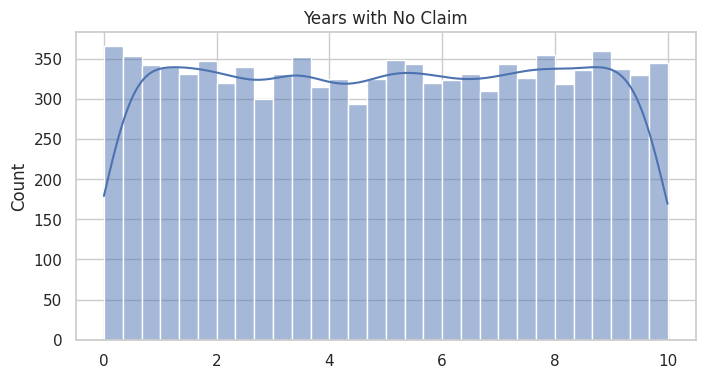

In [16]:
# 10. Years with no Claim (0 - 10 years)
years_no_claim = np.random.uniform(0, 10, n_samples)
plot_feature(years_no_claim, 'Years with No Claim', bins=30)

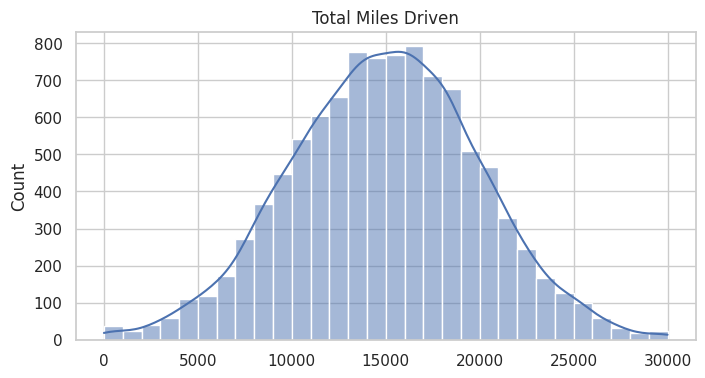

In [17]:
# 11. Total Miles Driven (0-30000 miles/year)
miles_driven = np.clip(np.random.normal(15000, 5000, n_samples), 0, 30000)
plot_feature(miles_driven, 'Total Miles Driven', bins=30)


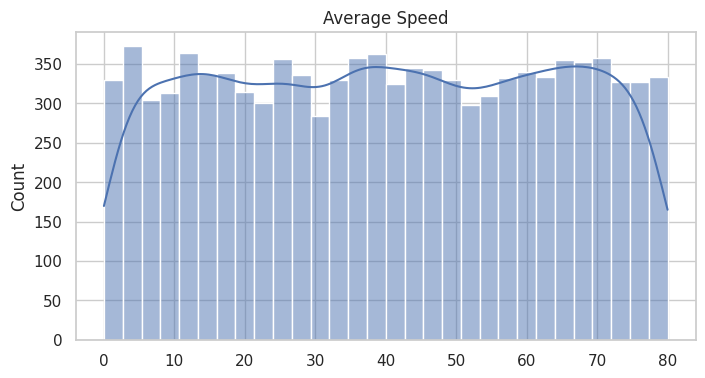

In [18]:
# 12. Average Speed (0-80 mph)
avg_speed = np.random.uniform(0, 80, n_samples)
plot_feature(avg_speed, 'Average Speed', bins=30)

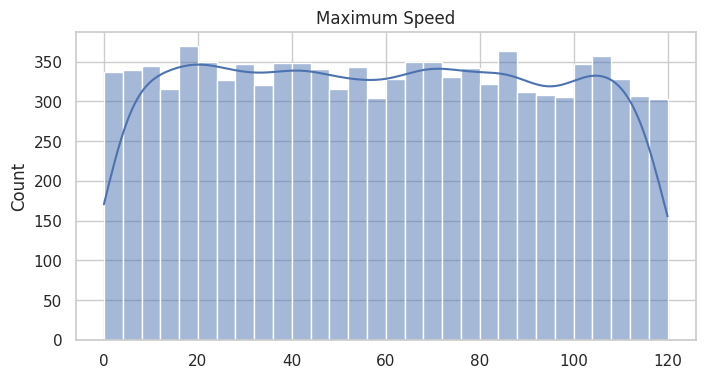

In [19]:
# 13. Maximum Speed (0-120 mph)
max_speed = np.random.uniform(0, 120, n_samples)
plot_feature(max_speed, 'Maximum Speed', bins=30)

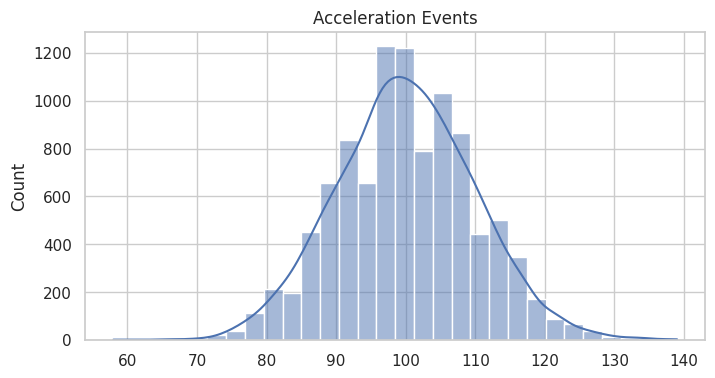

In [20]:
# 14. Acceleration Events (0-500 events/year)
acceleration_events = poisson.rvs(100, size=n_samples)
acceleration_events = np.clip(acceleration_events, 0, 500)
plot_feature(acceleration_events, 'Acceleration Events', bins=30)

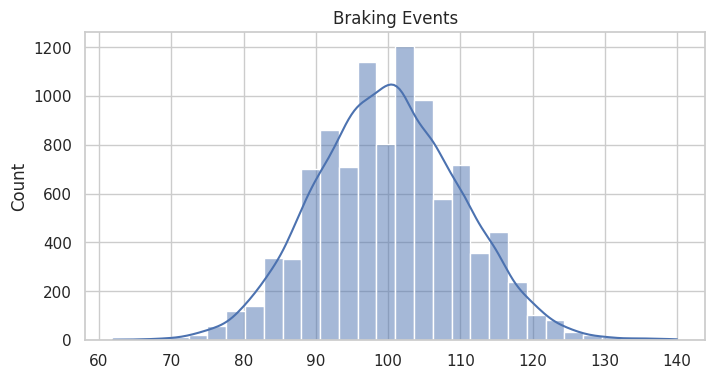

In [21]:
# 15. Braking Events (0-500 events/year)
braking_events = poisson.rvs(100, size=n_samples)
braking_events = np.clip(braking_events, 0, 500)
plot_feature(braking_events, 'Braking Events', bins=30)

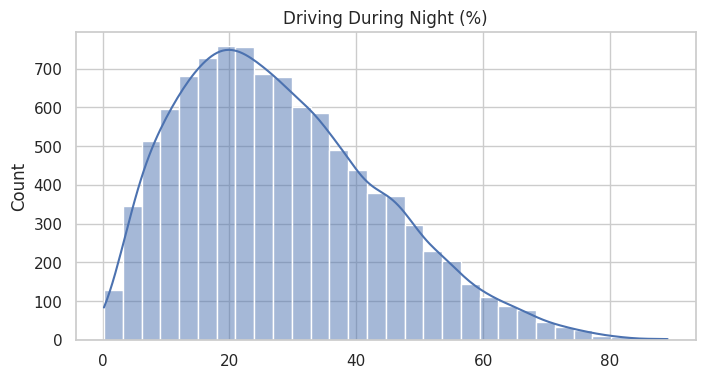

In [22]:
# 16. Driving during Night (0-100%)
night_driving = beta.rvs(2, 5, size=n_samples) * 100
plot_feature(night_driving, 'Driving During Night (%)', bins=30)

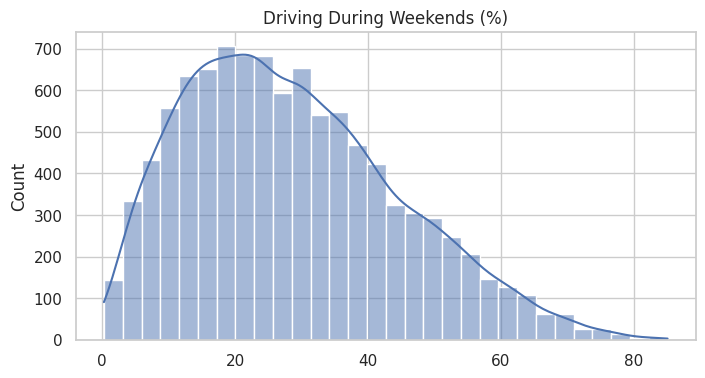

In [23]:
# 17. Driving during weekends (0-100%)
weekend_driving = beta.rvs(2, 5, size=n_samples) * 100
plot_feature(weekend_driving, 'Driving During Weekends (%)', bins=30)

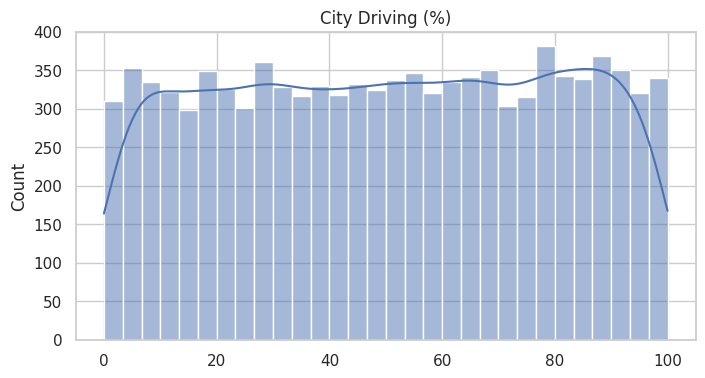

In [24]:
# 18. City Driving (0-100%)
city_driving = np.random.uniform(0, 100, n_samples)
plot_feature(city_driving, 'City Driving (%)', bins=30)


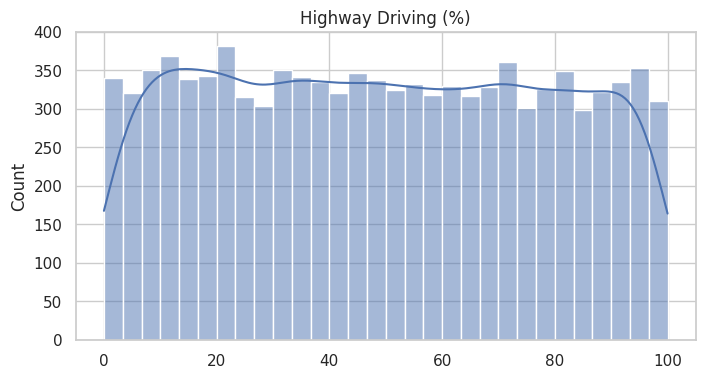

In [25]:
# 19. Highway Driving (0-100%)
highway_driving = 100 - city_driving
plot_feature(highway_driving, 'Highway Driving (%)', bins=30)

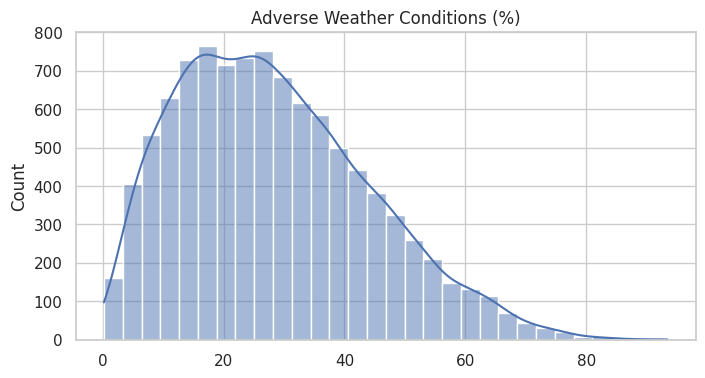

In [26]:
# 20. Weather Conditions (0-100%)
adverse_weather = beta.rvs(2, 5, size=n_samples) * 100
plot_feature(adverse_weather, 'Adverse Weather Conditions (%)', bins=30)

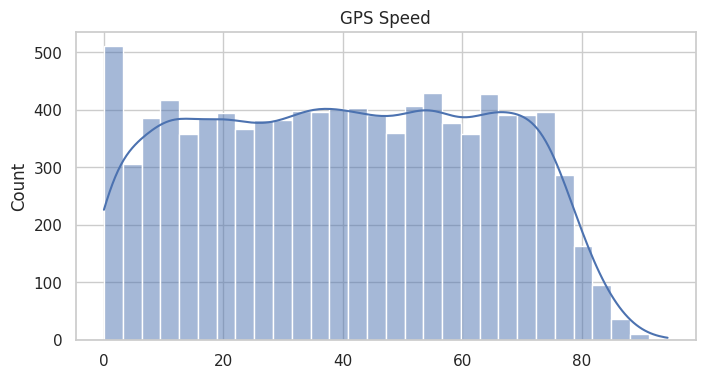

In [27]:
# 21. GPS Speed (around average speed)
gps_speed = np.clip(np.random.normal(avg_speed, 5, n_samples), 0, 120)
plot_feature(gps_speed, 'GPS Speed', bins=30)

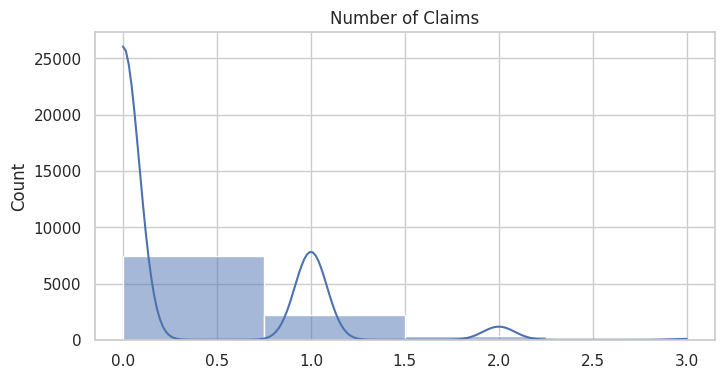

In [28]:
# 22. Number of Claims (0-3)
num_claims = np.clip(poisson.rvs(0.3, size=n_samples), 0, 3)
plot_feature(num_claims, 'Number of Claims', bins=4)


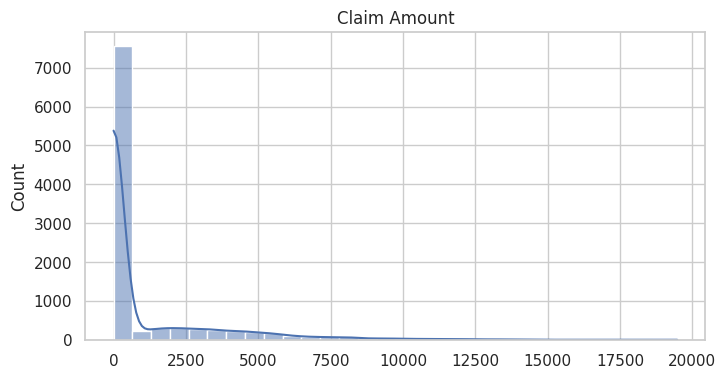

In [29]:
# 23. Claim Amount (0-100,000)
claim_amounts = gamma.rvs(2, scale=2000, size=n_samples) * (num_claims > 0)
claim_amounts = np.clip(claim_amounts, 0, 100000)
plot_feature(claim_amounts, 'Claim Amount', bins=30)


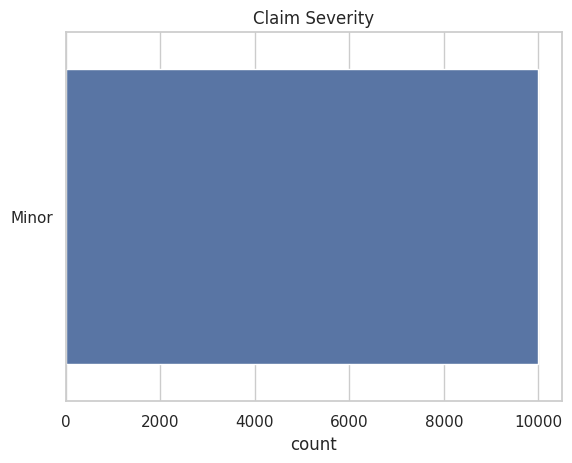

In [30]:
# 24. Claim Severity
claim_severity = np.where(claim_amounts < 20000, 'Minor', 
                          np.where(claim_amounts < 50000, 'Major', 'Total Loss'))
sns.countplot(y=claim_severity)
plt.title('Claim Severity')
plt.show()


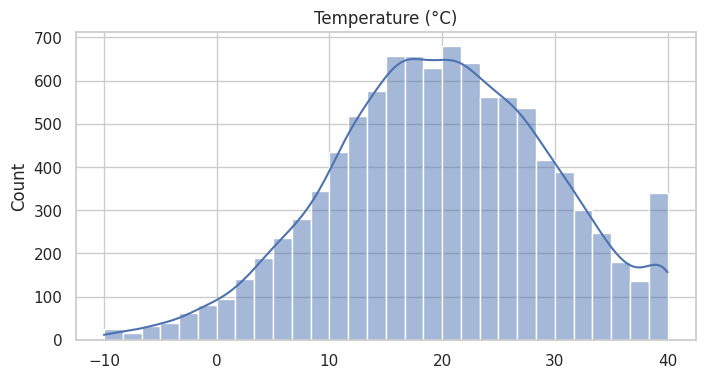

In [31]:
# 25. Temperature (-10 to 40°C)
temperatures = np.clip(np.random.normal(20, 10, n_samples), -10, 40)
plot_feature(temperatures, 'Temperature (°C)', bins=30)


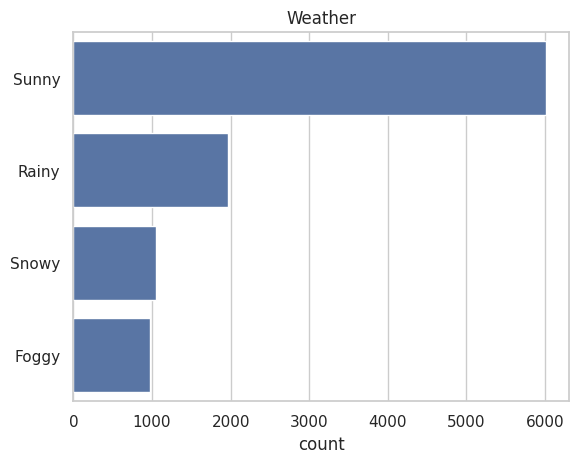

In [32]:
# 26. Weather
weather_conditions = np.random.choice(['Sunny', 'Rainy', 'Snowy', 'Foggy'], n_samples, p=[0.6, 0.2, 0.1, 0.1])
sns.countplot(y=weather_conditions)
plt.title('Weather')
plt.show()


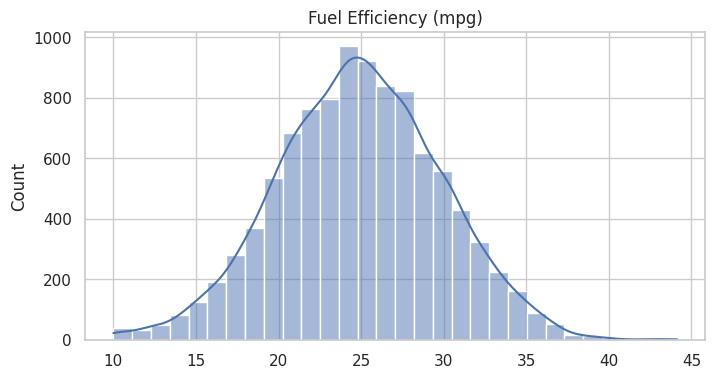

In [33]:
# 27. Fuel Efficiency (10-50 mpg)
fuel_efficiency = np.clip(np.random.normal(25, 5, n_samples), 10, 50)
plot_feature(fuel_efficiency, 'Fuel Efficiency (mpg)', bins=30)


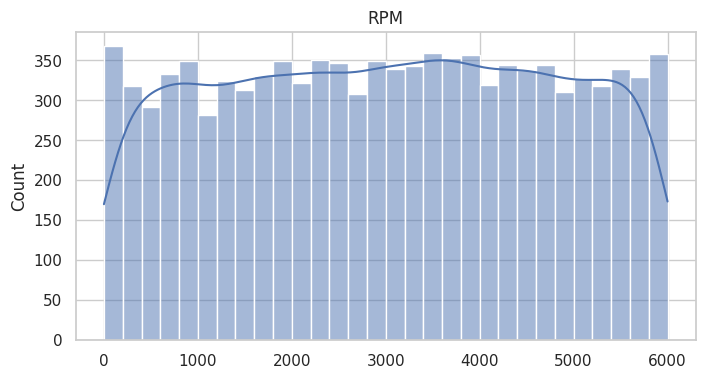

In [34]:
# 28. RPM (0-6000)
rpm = np.random.uniform(0, 6000, n_samples)
plot_feature(rpm, 'RPM', bins=30)


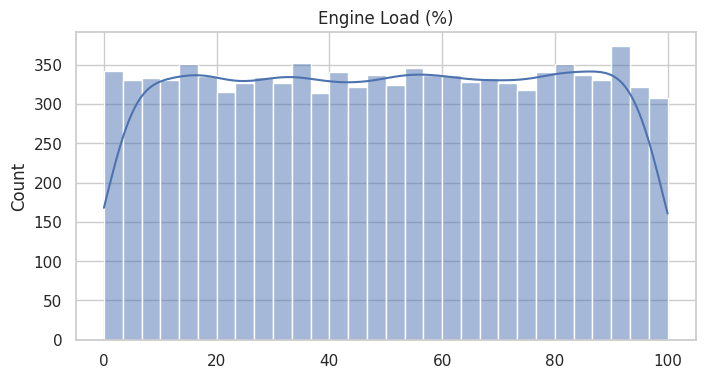

In [35]:
# 29. Engine Load (0-100%)
engine_load = np.random.uniform(0, 100, n_samples)
plot_feature(engine_load, 'Engine Load (%)', bins=30)

In [36]:

telematics_data_pd = pd.DataFrame({
    'Timestamp': timestamps,
    'DriverID': driver_ids,
    'Driver Age': driver_ages,
    'Gender': genders,
    'Credit Score': credit_scores,
    'Vehicle Age': vehicle_ages,
    'Vehicle Type': vehicle_types,
    'Vehicle Use': vehicle_use,
    'Insurance Duration': insurance_duration,
    'Years with No Claim': years_no_claim,
    'Total Miles Driven': miles_driven,
    'Average Speed': avg_speed,
    'Maximum Speed': max_speed,
    'Acceleration Events': acceleration_events,
    'Braking Events': braking_events,
    'Driving during Night (%)': night_driving,
    'Driving during Weekends (%)': weekend_driving,
    'City Driving (%)': city_driving,
    'Highway Driving (%)': highway_driving,
    'Weather Conditions (%)': adverse_weather,
    'GPS Speed': gps_speed,
    'Number of Claims': num_claims,
    'Claim Amount': claim_amounts,
    'Claim Severity': claim_severity,
    'Temperature (°C)': temperatures,
    'Weather': weather_conditions,
    'Fuel Efficiency (mpg)': fuel_efficiency,
    'RPM': rpm,
    'Engine Load (%)': engine_load
})

# Convert Pandas DataFrame to Spark DataFrame
telematics_data = spark.createDataFrame(telematics_data_pd)
telematics_data.show(5)

24/11/03 13:49:27 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


+-------------------+--------+------------------+------+-----------------+-------------------+------------+-----------+------------------+-------------------+------------------+------------------+------------------+-------------------+--------------+------------------------+---------------------------+------------------+-------------------+----------------------+------------------+----------------+-----------------+--------------+-----------------+-------+---------------------+------------------+-------------------+
|          Timestamp|DriverID|        Driver Age|Gender|     Credit Score|        Vehicle Age|Vehicle Type|Vehicle Use|Insurance Duration|Years with No Claim|Total Miles Driven|     Average Speed|     Maximum Speed|Acceleration Events|Braking Events|Driving during Night (%)|Driving during Weekends (%)|  City Driving (%)|Highway Driving (%)|Weather Conditions (%)|         GPS Speed|Number of Claims|     Claim Amount|Claim Severity| Temperature (°C)|Weather|Fuel Efficiency (m

In [42]:
from kafka import KafkaProducer
import json
import pandas as pd
import time

# Initialize Kafka producer
producer = KafkaProducer(
    bootstrap_servers='localhost:9092',
    value_serializer=lambda v: json.dumps(v).encode('utf-8')
)

# Convert DataFrame rows to dictionaries
telematics_data_records = telematics_data_pd.to_dict(orient='records')

# Function to stream data to Kafka
def stream_data_to_kafka():
    for record in telematics_data_records:
        producer.send('telematics_data', value=record)
        print(f"Sent: {record}")
        time.sleep(0.5)  # Adjust the sleep time for desired streaming rate
from kafka import KafkaProducer
import json
import pandas as pd
import time

# Ensure Timestamp column is in string format
telematics_data_pd['Timestamp'] = telematics_data_pd['Timestamp'].astype(str)

# Initialize Kafka producer
producer = KafkaProducer(
    bootstrap_servers='localhost:9092',
    value_serializer=lambda v: json.dumps(v).encode('utf-8')
)

# Convert DataFrame rows to dictionaries
telematics_data_records = telematics_data_pd.to_dict(orient='records')

# Function to stream data to Kafka
def stream_data_to_kafka():
    for record in telematics_data_records:
        producer.send('telematics_data', value=record)
        print(f"Sent: {record}")
        time.sleep(0.1)  # Adjust the sleep time for desired streaming rate

# Start streaming data
stream_data_to_kafka()




Sent: {'Timestamp': '2024-04-12', 'DriverID': 1, 'Driver Age': 37.803549844662456, 'Gender': 'Male', 'Credit Score': 663.1468608562985, 'Vehicle Age': 0.23946776734285982, 'Vehicle Type': 'SUV', 'Vehicle Use': 'Personal', 'Insurance Duration': 7.2724577966649315, 'Years with No Claim': 9.294103967369079, 'Total Miles Driven': 12407.89127434018, 'Average Speed': 40.85988824963052, 'Maximum Speed': 16.89473799033834, 'Acceleration Events': 93, 'Braking Events': 86, 'Driving during Night (%)': 19.60678435240779, 'Driving during Weekends (%)': 68.7393075534407, 'City Driving (%)': 10.258679213701905, 'Highway Driving (%)': 89.74132078629809, 'Weather Conditions (%)': 70.2980211317155, 'GPS Speed': 46.99092112826009, 'Number of Claims': 0, 'Claim Amount': 0.0, 'Claim Severity': 'Minor', 'Temperature (°C)': 16.43294622859469, 'Weather': 'Sunny', 'Fuel Efficiency (mpg)': 20.985893616997366, 'RPM': 1233.854584445046, 'Engine Load (%)': 18.476577315540354}
Sent: {'Timestamp': '2024-12-14', 'Dri

## Training the Model

### Risk Prediction and Analysis

In [43]:
from pyspark.ml.feature import VectorAssembler
from pyspark.sql.functions import when

# Create a binary label for accident occurrence based on 'Number of Claims'
telematics_data = telematics_data.withColumn('accident', when(telematics_data['Number of Claims'] > 0, 1).otherwise(0))

# Select features to include in the model
feature_columns = ['Total Miles Driven', 'Average Speed', 'Driving during Night (%)', 'Acceleration Events', 'Braking Events']

# Vectorize the feature columns
assembler = VectorAssembler(inputCols=feature_columns, outputCol='features')
telematics_data = assembler.transform(telematics_data)
telematics_data.select('features', 'accident').show(5)

+--------------------+--------+
|            features|accident|
+--------------------+--------+
|[12407.8912743401...|       0|
|[8192.17756032644...|       0|
|[18799.7742853867...|       1|
|[14934.8011778164...|       0|
|[13259.4864212952...|       0|
+--------------------+--------+
only showing top 5 rows



In [44]:
# Split the data into training (80%) and testing (20%) sets
train_data, test_data = telematics_data.randomSplit([0.8, 0.2], seed=42)


In [45]:
from pyspark.ml.classification import LogisticRegression

# Initialize the Logistic Regression model
log_reg = LogisticRegression(labelCol='accident', featuresCol='features', maxIter=10)

# Train the model
log_reg_model = log_reg.fit(train_data)


In [46]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator

# Make predictions on the test data
predictions = log_reg_model.transform(test_data)
predictions.select('accident', 'prediction', 'probability').show(5)

# Evaluate the model
evaluator = BinaryClassificationEvaluator(labelCol='accident', metricName='areaUnderROC')
auc = evaluator.evaluate(predictions)
print(f"AUC: {auc}")

# Calculate accuracy
accuracy = predictions.filter(predictions.accident == predictions.prediction).count() / float(test_data.count())
print(f"Accuracy: {accuracy}")

# Optionally, you can evaluate precision and recall using MulticlassClassificationEvaluator if needed.


+--------+----------+--------------------+
|accident|prediction|         probability|
+--------+----------+--------------------+
|       0|       0.0|[0.74692319166853...|
|       0|       0.0|[0.73535062407602...|
|       0|       0.0|[0.74579891747500...|
|       0|       0.0|[0.72629027335067...|
|       0|       0.0|[0.70855401546629...|
+--------+----------+--------------------+
only showing top 5 rows

AUC: 0.49865742156962717
Accuracy: 0.764022233451238


In [47]:
from pyspark.ml.classification import RandomForestClassifier

# Random Forest model
rf = RandomForestClassifier(labelCol='accident', featuresCol='features', numTrees=100, maxDepth=10)
rf_model = rf.fit(train_data)


24/11/03 16:41:35 WARN DAGScheduler: Broadcasting large task binary with size 1525.7 KiB
24/11/03 16:41:36 WARN DAGScheduler: Broadcasting large task binary with size 2.5 MiB
24/11/03 16:41:37 WARN DAGScheduler: Broadcasting large task binary with size 3.8 MiB
24/11/03 16:41:40 WARN DAGScheduler: Broadcasting large task binary with size 5.7 MiB


In [48]:
from pyspark.ml.classification import GBTClassifier

# Gradient-Boosted Trees model
gbt = GBTClassifier(labelCol='accident', featuresCol='features', maxIter=50, maxDepth=5)
gbt_model = gbt.fit(train_data)


In [49]:
from pyspark.ml.classification import MultilayerPerceptronClassifier

# Define the layers for the MLP
layers = [5, 10, 5, 2]

# MLP model
mlp = MultilayerPerceptronClassifier(labelCol='accident', featuresCol='features', maxIter=100, layers=layers, blockSize=128, seed=42)
mlp_model = mlp.fit(train_data)


In [50]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator

# Define evaluator for AUC
evaluator = BinaryClassificationEvaluator(labelCol='accident', metricName='areaUnderROC')

# Predictions and evaluation for each model
models = {
    "Logistic Regression": log_reg_model,
    "Random Forest": rf_model,
    "Gradient-Boosted Trees": gbt_model,
    "Multilayer Perceptron": mlp_model
}

# Store results for comparison
results = {}

# Evaluate each model
for model_name, model in models.items():
    predictions = model.transform(test_data)
    auc = evaluator.evaluate(predictions)
    accuracy = predictions.filter(predictions.accident == predictions.prediction).count() / float(test_data.count())
    results[model_name] = {"AUC": auc, "Accuracy": accuracy}
    print(f"{model_name} - AUC: {auc:.4f}, Accuracy: {accuracy:.4f}")


Logistic Regression - AUC: 0.4987, Accuracy: 0.7640


24/11/03 16:42:29 WARN DAGScheduler: Broadcasting large task binary with size 3.9 MiB
24/11/03 16:42:30 WARN DAGScheduler: Broadcasting large task binary with size 3.9 MiB


Random Forest - AUC: 0.5039, Accuracy: 0.7610
Gradient-Boosted Trees - AUC: 0.4936, Accuracy: 0.7549
Multilayer Perceptron - AUC: 0.4997, Accuracy: 0.7640


In [52]:
import os

model_save_dir = "/home/skidrow/bigdata_project/models"
model_path = os.path.join(model_save_dir, "risk_pred_rf")
model.write().overwrite().save(model_path)
print(f"Model saved to {model_path}") 

Model saved to /home/skidrow/bigdata_project/models/risk_pred_rf


#### Claim Frequency

In [53]:

telematics_data = telematics_data.drop('features')

In [54]:
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml import Pipeline

# Index categorical variables if any (e.g., Vehicle Type, Gender)
vehicle_type_indexer = StringIndexer(inputCol='Vehicle Type', outputCol='VehicleTypeIndex')
gender_indexer = StringIndexer(inputCol='Gender', outputCol='GenderIndex')

# Assemble feature columns into a single vector
assembler = VectorAssembler(
    inputCols=[
        'Vehicle Age', 'Driver Age', 'Driving during Night (%)', 
        'Acceleration Events', 'Braking Events', 'GenderIndex', 
        'VehicleTypeIndex'
    ],
    outputCol='features'
)

# Create a pipeline for data transformation
pipeline = Pipeline(stages=[vehicle_type_indexer, gender_indexer, assembler])
telematics_data_transformed = pipeline.fit(telematics_data).transform(telematics_data)

# Display the transformed data
telematics_data_transformed.select('features', 'Number of Claims').show(5, truncate=False)


+----------------------------------------------------------------------------+----------------+
|features                                                                    |Number of Claims|
+----------------------------------------------------------------------------+----------------+
|[0.23946776734285982,37.803549844662456,19.60678435240779,93.0,86.0,0.0,1.0]|0               |
|[0.65117810756085,33.553240488365084,13.621966270597003,122.0,125.0,1.0,3.0]|0               |
|[1.7562417858835166,43.312192787385285,10.00667864567717,121.0,94.0,0.0,2.0]|1               |
|[1.4995365237943312,56.181924894390775,36.713083890236184,90.0,87.0,0.0,0.0]|0               |
|[6.515774611696889,44.61424832958519,25.73171913183024,94.0,101.0,2.0,0.0]  |0               |
+----------------------------------------------------------------------------+----------------+
only showing top 5 rows



In [55]:
from pyspark.ml.regression import GeneralizedLinearRegression

# Poisson Regression Model
poisson_model = GeneralizedLinearRegression(
    family="poisson", link="log", labelCol="Number of Claims", featuresCol="features"
)

# Fit the model on the training data
poisson_model_fitted = poisson_model.fit(train_data)

# Summarize the model
print(f"Poisson Model Coefficients: {poisson_model_fitted.coefficients}")
print(f"Poisson Model Intercept: {poisson_model_fitted.intercept}")


24/11/03 16:47:05 WARN Instrumentation: [4fa36cbe] regParam is zero, which might cause numerical instability and overfitting.
24/11/03 16:47:05 WARN Instrumentation: [4fa36cbe] regParam is zero, which might cause numerical instability and overfitting.
24/11/03 16:47:06 WARN Instrumentation: [4fa36cbe] regParam is zero, which might cause numerical instability and overfitting.
24/11/03 16:47:06 WARN Instrumentation: [4fa36cbe] regParam is zero, which might cause numerical instability and overfitting.
24/11/03 16:47:06 WARN Instrumentation: [4fa36cbe] regParam is zero, which might cause numerical instability and overfitting.
24/11/03 16:47:07 WARN Instrumentation: [4fa36cbe] regParam is zero, which might cause numerical instability and overfitting.


Poisson Model Coefficients: [7.611169624862277e-06,0.00040811594513303034,0.0006284350753018431,0.0016116669134777564,0.0013995624445540967]
Poisson Model Intercept: -1.6469279554813405


In [56]:
# Make predictions on the test set
predictions = poisson_model_fitted.transform(test_data)

# Display predictions
predictions.select('features', 'Number of Claims', 'prediction').show(5)

# Evaluate the model using RMSE and other metrics
from pyspark.ml.evaluation import RegressionEvaluator

evaluator = RegressionEvaluator(
    labelCol="Number of Claims", predictionCol="prediction", metricName="rmse"
)

rmse = evaluator.evaluate(predictions)
print(f"Root Mean Squared Error (RMSE) on test data = {rmse}")


+--------------------+----------------+-------------------+
|            features|Number of Claims|         prediction|
+--------------------+----------------+-------------------+
|[12887.8937169368...|               0|0.28662697743342735|
|[16883.1061205733...|               0| 0.3021487462169611|
|[13525.6565536320...|               0|0.29365754484098244|
|[20427.9475948219...|               0|   0.30964040929958|
|[19093.8002376696...|               0| 0.3372006903696884|
+--------------------+----------------+-------------------+
only showing top 5 rows

Root Mean Squared Error (RMSE) on test data = 0.5213828696637403


In [57]:
model_save_dir = "/home/skidrow/bigdata_project/models/poisson_claim_freq"
poisson_model_fitted.write().overwrite().save(model_save_dir)
print(f"Poisson model saved to {model_save_dir}")

Poisson model saved to /home/skidrow/bigdata_project/models/poisson_claim_freq


### Claim Severity Prediction

In [58]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
from pyspark.ml.feature import StringIndexer, VectorAssembler, StandardScaler
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml import Pipeline


In [59]:
# Selecting features for the model
selected_features = [
    'Maximum Speed', 
    'Weather Conditions (%)', 
    'Acceleration Events', 
    'Braking Events', 
    'Driving during Night (%)', 
    'City Driving (%)', 
    'Fuel Efficiency (mpg)'
]

# Indexing the target variable
indexer = StringIndexer(inputCol="Claim Severity", outputCol="label")

# Assemble features into a single vector
assembler = VectorAssembler(inputCols=selected_features, outputCol="features")


In [60]:
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=False)


In [61]:
# Define the Random Forest Classifier
rf_classifier = RandomForestClassifier(featuresCol='scaledFeatures', labelCol='label', numTrees=100)

train_data = train_data.drop('features')
test_data = test_data.drop('features')


In [62]:
# Create a pipeline
pipeline = Pipeline(stages=[indexer, assembler, scaler, rf_classifier])

# Fit the model
rf_model = pipeline.fit(train_data)


In [63]:
# Make predictions
predictions = rf_model.transform(test_data)

# Show some sample predictions
predictions.select("features", "scaledFeatures", "label", "prediction", "Claim Severity").show(5)


+--------------------+--------------------+-----+----------+--------------+
|            features|      scaledFeatures|label|prediction|Claim Severity|
+--------------------+--------------------+-----+----------+--------------+
|[44.0288779522219...|[1.27262724711936...|  0.0|       0.0|         Minor|
|[39.8840572078317...|[1.15282378950092...|  0.0|       0.0|         Minor|
|[12.0803590505084...|[0.34917524128925...|  0.0|       0.0|         Minor|
|[26.8397173213606...|[0.77578528358616...|  0.0|       0.0|         Minor|
|[31.2080020231260...|[0.90204782747097...|  0.0|       0.0|         Minor|
+--------------------+--------------------+-----+----------+--------------+
only showing top 5 rows



In [64]:
# Initialize the evaluator
evaluator = MulticlassClassificationEvaluator(
    labelCol="label", predictionCol="prediction", metricName="accuracy")

# Calculate accuracy
accuracy = evaluator.evaluate(predictions)
print(f"Model Accuracy: {accuracy * 100:.2f}%")

# Evaluate other metrics if needed
evaluator_f1 = MulticlassClassificationEvaluator(
    labelCol="label", predictionCol="prediction", metricName="f1")
f1_score = evaluator_f1.evaluate(predictions)
print(f"F1 Score: {f1_score:.2f}")


Model Accuracy: 100.00%
F1 Score: 1.00


In [65]:
model_save_dir = "/home/skidrow/bigdata_project/models/rf_claim_sev_pred"
rf_model.write().overwrite().save(model_save_dir)
print(f"Poisson model saved to {model_save_dir}")

Poisson model saved to /home/skidrow/bigdata_project/models/rf_claim_sev_pred


## Behavioural Analysis

#### Driver Behaviour Clustering

In [66]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator


In [67]:
# Select the relevant features
feature_columns = ['Average Speed', 'Braking Events', 'Acceleration Events', 'Driving during Night (%)']

# Create a feature vector using VectorAssembler
assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")
assembled_data = assembler.transform(telematics_data)

# Optional: Standardize the features to ensure they are on the same scale
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures")
scaler_model = scaler.fit(assembled_data)
scaled_data = scaler_model.transform(assembled_data)


In [68]:
# Define the K-means model with 3 clusters
kmeans = KMeans(featuresCol="scaledFeatures", predictionCol="prediction", k=3, seed=42)

# Fit the model to the scaled data
kmeans_model = kmeans.fit(scaled_data)

# Make predictions on the data
clustered_data = kmeans_model.transform(scaled_data)


In [69]:
# Evaluate the clustering model using Silhouette score
evaluator = ClusteringEvaluator(featuresCol="scaledFeatures", metricName="silhouette", distanceMeasure="squaredEuclidean")
silhouette_score = evaluator.evaluate(clustered_data)
print(f"Silhouette Score: {silhouette_score}")


Silhouette Score: 0.2773737593727465


In [70]:
# Show the first few rows with their cluster assignments
clustered_data.select('DriverID', 'Average Speed', 'Braking Events', 'Acceleration Events', 
                      'Driving during Night (%)', 'prediction').show(10)


+--------+------------------+--------------+-------------------+------------------------+----------+
|DriverID|     Average Speed|Braking Events|Acceleration Events|Driving during Night (%)|prediction|
+--------+------------------+--------------+-------------------+------------------------+----------+
|       1| 40.85988824963052|            86|                 93|       19.60678435240779|         0|
|       2| 65.09780432625402|           125|                122|      13.621966270597003|         2|
|       3| 13.29406407817805|            94|                121|       10.00667864567717|         1|
|       4|20.152930513635763|            87|                 90|      36.713083890236184|         1|
|       5|  31.9147500497637|           101|                 94|       25.73171913183024|         2|
|       6| 68.73168255825439|           106|                110|      26.354980675834494|         0|
|       7| 76.57269426251902|           112|                 89|       21.68429730405495|  

In [71]:
# Get the cluster centers (centroids)
centers = kmeans_model.clusterCenters()
for idx, center in enumerate(centers):
    print(f"Cluster {idx} Center: {center}")


Cluster 0 Center: [ 2.65583829  9.60988515 10.38696095  1.81904246]
Cluster 1 Center: [ 0.78017538  9.66880766 10.22391664  2.01280927]
Cluster 2 Center: [ 1.77703679 10.96383423  9.52718805  1.50842906]


In [72]:
# Select relevant columns and convert to Pandas DataFrame
pandas_df = clustered_data.select(
    'Average Speed', 'Braking Events', 'Acceleration Events', 
    'Driving during Night (%)', 'prediction'
).toPandas()


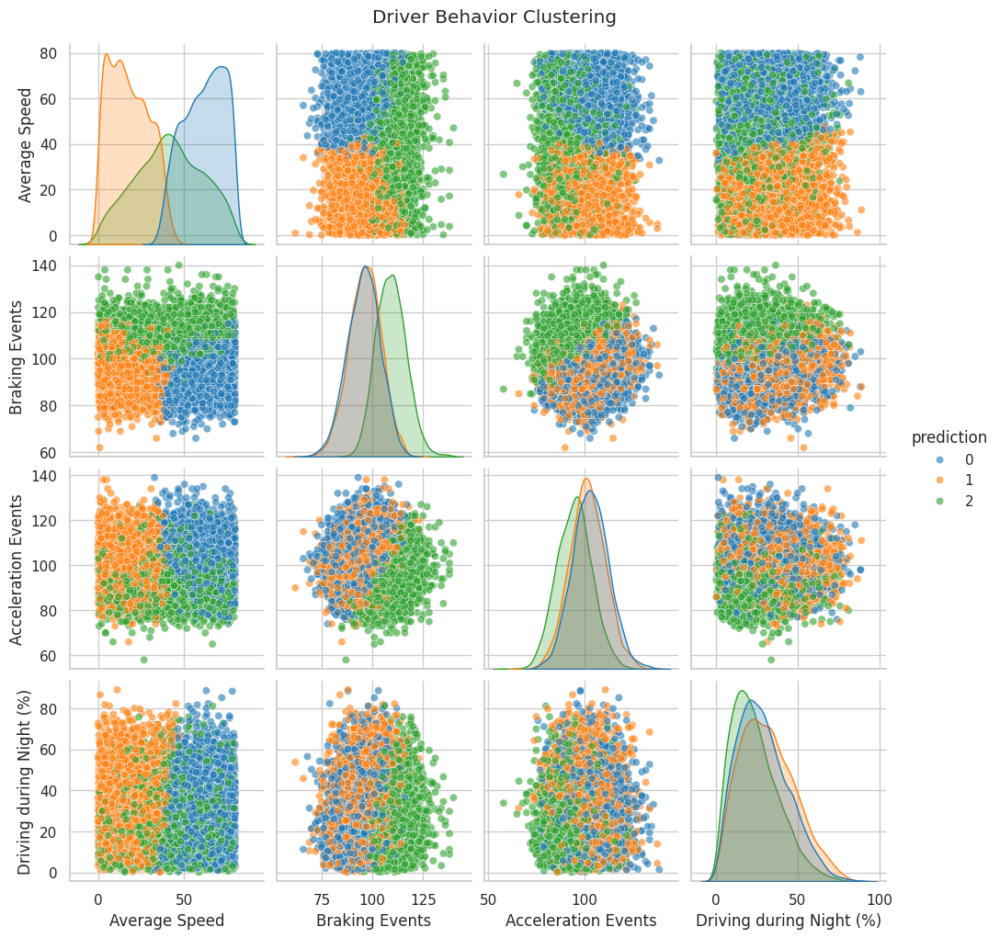

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pair plot of features with hue based on cluster predictions
sns.pairplot(
    pandas_df, 
    vars=['Average Speed', 'Braking Events', 'Acceleration Events', 'Driving during Night (%)'], 
    hue='prediction', 
    palette='tab10', 
    plot_kws={'alpha': 0.6}
)
plt.suptitle('Driver Behavior Clustering', y=1.02)
plt.show()


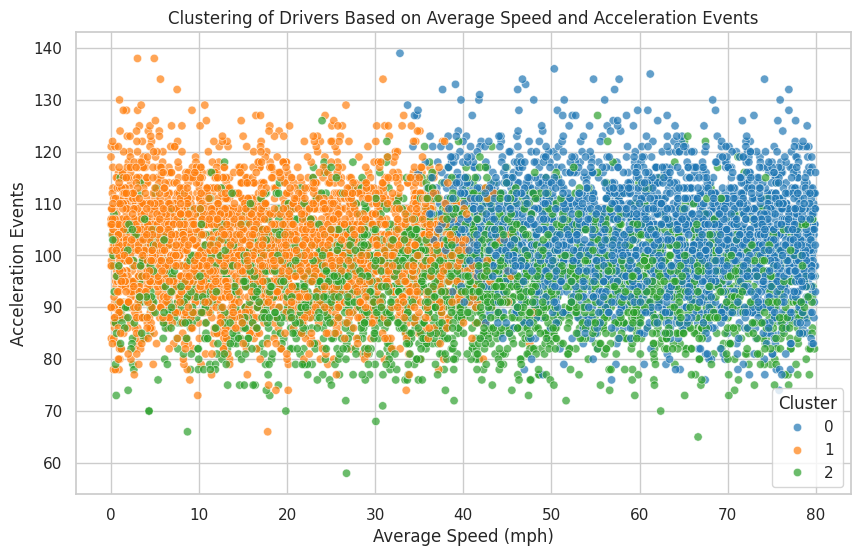

In [74]:
# Scatter plot for Average Speed vs. Acceleration Events
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=pandas_df, 
    x='Average Speed', 
    y='Acceleration Events', 
    hue='prediction', 
    palette='tab10', 
    alpha=0.7
)
plt.title('Clustering of Drivers Based on Average Speed and Acceleration Events')
plt.xlabel('Average Speed (mph)')
plt.ylabel('Acceleration Events')
plt.legend(title='Cluster')
plt.show()


In [75]:
model_save_dir = "/home/skidrow/bigdata_project/models/driver_behav_clust_kmeans"
kmeans_model.write().overwrite().save(model_save_dir)
print(f"Poisson model saved to {model_save_dir}")

Poisson model saved to /home/skidrow/bigdata_project/models/driver_behav_clust_kmeans


## Insurance Premium Calculation

Usage-Based Insurance (UBI) Analysis: With data like Total Miles Driven, Driving During Night, and Acceleration Events, you can design a Pay-As-You-Drive (PAYD) or Pay-How-You-Drive (PHYD) insurance product. This allows for dynamic premium calculations based on real-time driving data.

In [76]:
telematics_data=telematics_data.drop("features")
telematics_data=telematics_data.drop("scaled_features")


In [77]:
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator

# Select the relevant features for PAYD and PHYD models
feature_columns = [
    'Total Miles Driven', 
    'Driving during Night (%)', 
    'Acceleration Events', 
    'Braking Events', 
    'Average Speed', 
    'Maximum Speed', 
    'City Driving (%)', 
    'Highway Driving (%)'
]

# Assemble features into a single vector
assembler = VectorAssembler(inputCols=feature_columns, outputCol='features')
telematics_data = assembler.transform(telematics_data)

# Select target variable for PAYD/PHYD analysis (e.g., Claim Amount or Insurance Premium)
telematics_data = telematics_data.withColumn('label', telematics_data['Claim Amount'])

In [78]:
from pyspark.ml.feature import StandardScaler

scaler = StandardScaler(inputCol='features', outputCol='scaled_features')
scaler_model = scaler.fit(telematics_data)
telematics_data = scaler_model.transform(telematics_data)
# Split the data into training and testing sets (80% training, 20% testing)
train_data, test_data = telematics_data.randomSplit([0.8, 0.2], seed=42)


In [79]:
from pyspark.ml.regression import LinearRegression, RandomForestRegressor, GBTRegressor
from pyspark.ml.evaluation import RegressionEvaluator

# Define models
lr = LinearRegression(featuresCol='scaled_features', labelCol='label', maxIter=100, regParam=0.1, elasticNetParam=0.8)
rf = RandomForestRegressor(featuresCol='scaled_features', labelCol='label', numTrees=50, maxDepth=10, seed=42)
gbt = GBTRegressor(featuresCol='scaled_features', labelCol='label', maxIter=100, maxDepth=5, seed=42)


In [80]:
# Train the Linear Regression model
lr_model = lr.fit(train_data)

# Train the Random Forest model
rf_model = rf.fit(train_data)

# Train the Gradient Boosted Trees model
gbt_model = gbt.fit(train_data)


24/11/03 16:54:37 WARN DAGScheduler: Broadcasting large task binary with size 1514.7 KiB
24/11/03 16:54:37 WARN DAGScheduler: Broadcasting large task binary with size 2.3 MiB
24/11/03 16:54:39 WARN DAGScheduler: Broadcasting large task binary with size 3.4 MiB


In [81]:
# Initialize evaluators
evaluator_rmse = RegressionEvaluator(labelCol='label', predictionCol='prediction', metricName='rmse')
evaluator_r2 = RegressionEvaluator(labelCol='label', predictionCol='prediction', metricName='r2')

# Function to evaluate a model
def evaluate_model(model, test_data):
    predictions = model.transform(test_data)
    rmse = evaluator_rmse.evaluate(predictions)
    r2 = evaluator_r2.evaluate(predictions)
    return rmse, r2

# Evaluate each model
lr_rmse, lr_r2 = evaluate_model(lr_model, test_data)
rf_rmse, rf_r2 = evaluate_model(rf_model, test_data)
gbt_rmse, gbt_r2 = evaluate_model(gbt_model, test_data)

# Print results
print(f"Linear Regression - RMSE: {lr_rmse}, R2: {lr_r2}")
print(f"Random Forest - RMSE: {rf_rmse}, R2: {rf_r2}")
print(f"Gradient Boosted Trees - RMSE: {gbt_rmse}, R2: {gbt_r2}")


Linear Regression - RMSE: 2207.4611233814744, R2: -0.0038561633206397605
Random Forest - RMSE: 2221.9951969731237, R2: -0.01711859441420316
Gradient Boosted Trees - RMSE: 2377.4221016642573, R2: -0.16438862421230138


In [82]:

model_save_dir = "/home/skidrow/bigdata_project/models/insu_prem_lin_reg"
lr_model.write().overwrite().save(model_save_dir)
print(f"Poisson model saved to {model_save_dir}")

Poisson model saved to /home/skidrow/bigdata_project/models/insu_prem_lin_reg


### Risk Based 

In [83]:
telematics_data=telematics_data.drop("features")
telematics_data=telematics_data.drop("scaled_features")


In [84]:
# Define the features for the regression model
feature_columns = ['Vehicle Age', 'Total Miles Driven', 'Average Speed', 'Acceleration Events', 
                   'Braking Events', 'Driving during Night (%)', 'Driving during Weekends (%)', 
                   'City Driving (%)', 'Highway Driving (%)', 'Weather Conditions (%)']

# Assemble features into a single vector
assembler = VectorAssembler(inputCols=feature_columns, outputCol='features')
data = assembler.transform(telematics_data)

# Select features and label (Claim Amount)
final_data = data.select('features', 'Claim Amount')


In [85]:
# Split the data into training and testing sets
train_data, test_data = final_data.randomSplit([0.8, 0.2], seed=42)


In [86]:
# Initialize the Linear Regression model
lr = LinearRegression(labelCol='Claim Amount', featuresCol='features', maxIter=100, regParam=0.3, elasticNetParam=0.8)

# Train the model
lr_model = lr.fit(train_data)


In [87]:
# Make predictions on the test set
lr_predictions = lr_model.transform(test_data)

# Initialize the evaluator
evaluator = RegressionEvaluator(labelCol='Claim Amount', predictionCol='prediction', metricName='rmse')

# Calculate RMSE
rmse = evaluator.evaluate(predictions)
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Calculate R-squared
evaluator_r2 = RegressionEvaluator(labelCol='Claim Amount', predictionCol='prediction', metricName='r2')
r2 = evaluator_r2.evaluate(lr_predictions)
print(f"R-squared (R²): {r2}")


Root Mean Squared Error (RMSE): 2392.8005541052044
R-squared (R²): 0.00029188335965046885


In [88]:
rf = RandomForestRegressor(labelCol='Claim Amount', featuresCol='features', numTrees=50, maxDepth=10)
rf_model = rf.fit(train_data)
rf_predictions = rf_model.transform(test_data)


24/11/03 16:57:34 WARN DAGScheduler: Broadcasting large task binary with size 1530.6 KiB
24/11/03 16:57:35 WARN DAGScheduler: Broadcasting large task binary with size 2.3 MiB
24/11/03 16:57:36 WARN DAGScheduler: Broadcasting large task binary with size 3.5 MiB


In [89]:
gbt = GBTRegressor(labelCol='Claim Amount', featuresCol='features', maxIter=50)
gbt_model = gbt.fit(train_data)
gbt_predictions = gbt_model.transform(test_data)


In [90]:
from pyspark.ml.regression import DecisionTreeRegressor
dt = DecisionTreeRegressor(labelCol='Claim Amount', featuresCol='features', maxDepth=10)
dt_model = dt.fit(train_data)
dt_predictions = dt_model.transform(test_data)


In [91]:
def evaluate_model(predictions, model_name):
    evaluator_rmse = RegressionEvaluator(labelCol='Claim Amount', predictionCol='prediction', metricName='rmse')
    evaluator_r2 = RegressionEvaluator(labelCol='Claim Amount', predictionCol='prediction', metricName='r2')
    rmse = evaluator_rmse.evaluate(predictions)
    r2 = evaluator_r2.evaluate(predictions)
    print(f"{model_name} - RMSE: {rmse}, R-squared: {r2}")

# Evaluate Linear Regression Model
evaluate_model(lr_predictions, "Linear Regression")

# Evaluate Random Forest Model
evaluate_model(rf_predictions, "Random Forest Regressor")

# Evaluate Gradient-Boosted Trees Model
evaluate_model(gbt_predictions, "Gradient-Boosted Trees Regressor")

# Evaluate Decision Tree Model
evaluate_model(dt_predictions, "Decision Tree Regressor")


Linear Regression - RMSE: 2261.5331655972045, R-squared: 0.00029188335965046885
Random Forest Regressor - RMSE: 2270.7865448002435, R-squared: -0.007905744390034997
Gradient-Boosted Trees Regressor - RMSE: 2339.9469523581724, R-squared: -0.07023541909511333
Decision Tree Regressor - RMSE: 2459.2666215214654, R-squared: -0.18216616908813688


In [92]:
model_save_dir = "/home/skidrow/bigdata_project/models/GBT_claim_amount"
gbt_model.write().overwrite().save(model_save_dir)
print(f"Poisson model saved to {model_save_dir}")

Poisson model saved to /home/skidrow/bigdata_project/models/GBT_claim_amount


In [94]:
from pyspark.sql.functions import col, month, year, avg

# Aggregate total miles driven and GPS speed by month
monthly_data = telematics_data \
    .groupBy(year('Timestamp').alias('Year'), month('Timestamp').alias('Month')) \
    .agg(
        avg('Total Miles Driven').alias('Avg_Miles_Driven'),
        avg('GPS Speed').alias('Avg_GPS_Speed')
    ) \
    .orderBy('Year', 'Month')

monthly_data.show(5)


+----+-----+------------------+------------------+
|Year|Month|  Avg_Miles_Driven|     Avg_GPS_Speed|
+----+-----+------------------+------------------+
|2024|    1|14792.124737722615| 39.46151653774749|
|2024|    2|14790.383653712635|40.359019094059754|
|2024|    3|14838.175597317137| 41.12387196481895|
|2024|    4|15110.540864900755|40.313230303158804|
|2024|    5|14910.938949610196| 40.80850058568646|
+----+-----+------------------+------------------+
only showing top 5 rows



## Time Series Analysis

### Driver Behaviour Over Time

In [95]:
from pyspark.sql.functions import col, month, year, avg

# Aggregate total miles driven and GPS speed by month
monthly_data = telematics_data \
    .groupBy(year('Timestamp').alias('Year'), month('Timestamp').alias('Month')) \
    .agg(
        avg('Total Miles Driven').alias('Avg_Miles_Driven'),
        avg('GPS Speed').alias('Avg_GPS_Speed')
    ) \
    .orderBy('Year', 'Month')

monthly_data.show(5)


+----+-----+------------------+------------------+
|Year|Month|  Avg_Miles_Driven|     Avg_GPS_Speed|
+----+-----+------------------+------------------+
|2024|    1|14792.124737722615| 39.46151653774749|
|2024|    2|14790.383653712635|40.359019094059754|
|2024|    3|14838.175597317137| 41.12387196481895|
|2024|    4|15110.540864900755|40.313230303158804|
|2024|    5|14910.938949610196| 40.80850058568646|
+----+-----+------------------+------------------+
only showing top 5 rows



In [162]:
from pyspark.ml.feature import VectorAssembler

# Create a feature vector
vector_assembler = VectorAssembler(
    inputCols=['Month'],  # You can add more features if needed
    outputCol='features'
)

# Transform the data
prepared_data = vector_assembler.transform(monthly_data)
prepared_data.show(5)


+----+-----+------------------+------------------+--------+
|Year|Month|  Avg_Miles_Driven|     Avg_GPS_Speed|features|
+----+-----+------------------+------------------+--------+
|2024|    1|14792.124737722617| 39.46151653774749|   [1.0]|
|2024|    2|14790.383653712637| 40.35901909405976|   [2.0]|
|2024|    3| 14838.17559731714|41.123871964818946|   [3.0]|
|2024|    4|15110.540864900755| 40.31323030315882|   [4.0]|
|2024|    5|14910.938949610196|40.808500585686474|   [5.0]|
+----+-----+------------------+------------------+--------+
only showing top 5 rows



In [163]:
train_data, test_data = prepared_data.randomSplit([0.8, 0.2], seed=42)

In [164]:
from pyspark.ml.regression import LinearRegression

# Define the model
lr = LinearRegression(featuresCol='features', labelCol='Avg_Miles_Driven')

# Fit the model
lr_model = lr.fit(train_data)

# Print the coefficients and intercept for the model
print(f"Coefficients: {lr_model.coefficients}")
print(f"Intercept: {lr_model.intercept}")


24/10/26 17:56:03 WARN Instrumentation: [ceffce4a] regParam is zero, which might cause numerical instability and overfitting.


Coefficients: [17.323001132062352]
Intercept: 14848.034379865112


In [165]:
# Make predictions
predictions = lr_model.transform(test_data)

# Show some predictions
predictions.select('Year', 'Month', 'Avg_Miles_Driven', 'prediction').show(5)


+----+-----+------------------+------------------+
|Year|Month|  Avg_Miles_Driven|        prediction|
+----+-----+------------------+------------------+
|2024|    3| 14838.17559731714|14900.003383261299|
|2024|    7|15025.727762289027|14969.295387789549|
|2024|    9|14809.746171245066|15003.941390053673|
+----+-----+------------------+------------------+



In [166]:
from pyspark.ml.evaluation import RegressionEvaluator

# Create evaluators for RMSE and R-squared
rmse_evaluator = RegressionEvaluator(
    labelCol='Avg_Miles_Driven', predictionCol='prediction', metricName='rmse')
r2_evaluator = RegressionEvaluator(
    labelCol='Avg_Miles_Driven', predictionCol='prediction', metricName='r2')

# Evaluate RMSE and R2
rmse = rmse_evaluator.evaluate(predictions)
r2 = r2_evaluator.evaluate(predictions)

print(f"RMSE: {rmse}")
print(f"R-squared: {r2}")


RMSE: 122.09159268697799
R-squared: -0.6235484991532529


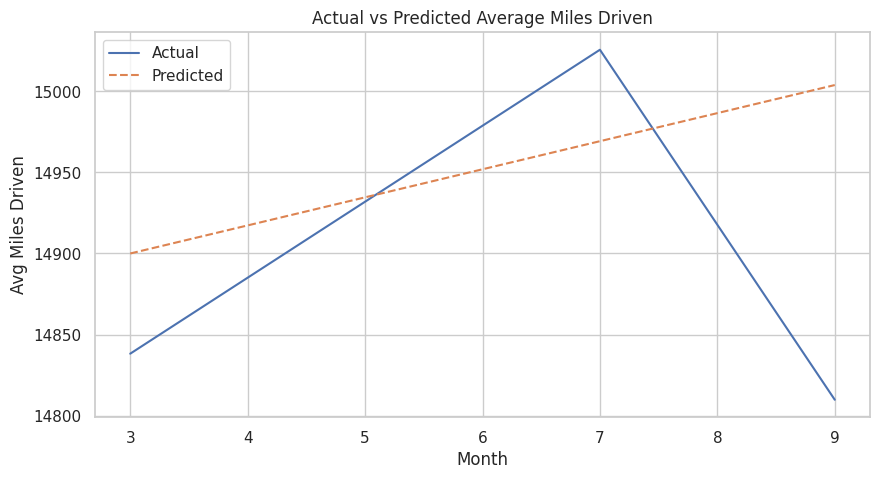

In [167]:
import matplotlib.pyplot as plt

# Convert to Pandas DataFrame for visualization
pandas_predictions = predictions.toPandas()

# Plot actual vs. predicted values
plt.figure(figsize=(10, 5))
plt.plot(pandas_predictions['Month'], pandas_predictions['Avg_Miles_Driven'], label='Actual')
plt.plot(pandas_predictions['Month'], pandas_predictions['prediction'], label='Predicted', linestyle='--')
plt.xlabel('Month')
plt.ylabel('Avg Miles Driven')
plt.title('Actual vs Predicted Average Miles Driven')
plt.legend()
plt.grid(True)
plt.show()


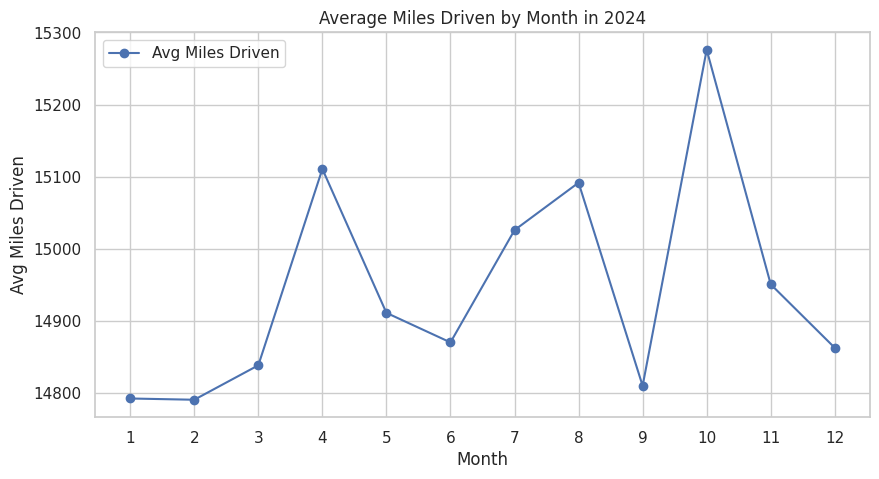

In [169]:
# Convert aggregated Spark DataFrame to Pandas for plotting
pandas_monthly_data = monthly_data.toPandas()

# Plotting the time series data for Avg_Miles_Driven
plt.figure(figsize=(10, 5))
plt.plot(pandas_monthly_data['Month'], pandas_monthly_data['Avg_Miles_Driven'], marker='o', label='Avg Miles Driven')
plt.xlabel('Month')
plt.ylabel('Avg Miles Driven')
plt.title('Average Miles Driven by Month in 2024')
plt.xticks(pandas_monthly_data['Month'])
plt.grid(True)
plt.legend()
plt.show()

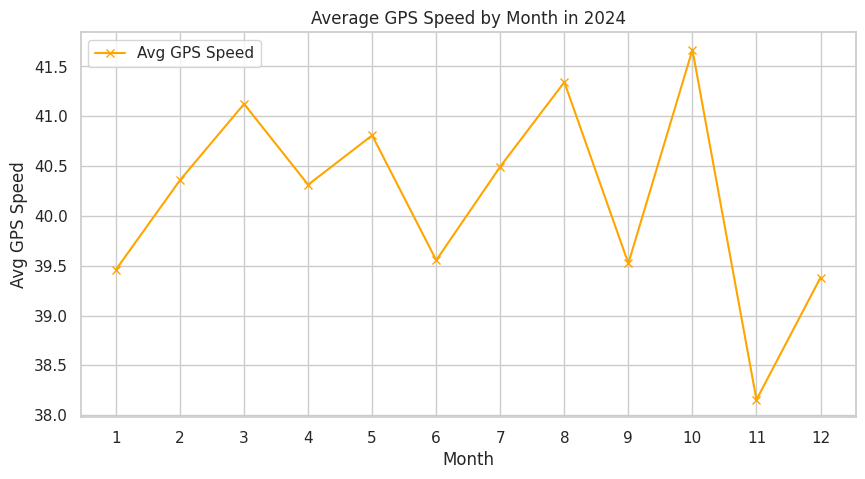

In [170]:
# Plotting the time series data for Avg_GPS_Speed
plt.figure(figsize=(10, 5))
plt.plot(pandas_monthly_data['Month'], pandas_monthly_data['Avg_GPS_Speed'], marker='x', color='orange', label='Avg GPS Speed')
plt.xlabel('Month')
plt.ylabel('Avg GPS Speed')
plt.title('Average GPS Speed by Month in 2024')
plt.xticks(pandas_monthly_data['Month'])
plt.grid(True)
plt.legend()
plt.show()

In [171]:
from pyspark.ml.feature import VectorAssembler

# Create a feature vector for month
vector_assembler = VectorAssembler(
    inputCols=['Month'],
    outputCol='features'
)

# Transform the data
prepared_data = vector_assembler.transform(monthly_data)
prepared_data.show(5)


+----+-----+------------------+------------------+--------+
|Year|Month|  Avg_Miles_Driven|     Avg_GPS_Speed|features|
+----+-----+------------------+------------------+--------+
|2024|    1|14792.124737722617| 39.46151653774749|   [1.0]|
|2024|    2|14790.383653712637| 40.35901909405976|   [2.0]|
|2024|    3| 14838.17559731714|41.123871964818946|   [3.0]|
|2024|    4|15110.540864900755| 40.31323030315882|   [4.0]|
|2024|    5|14910.938949610196|40.808500585686474|   [5.0]|
+----+-----+------------------+------------------+--------+
only showing top 5 rows



In [172]:
train_data, test_data = prepared_data.randomSplit([0.8, 0.2], seed=42)


In [173]:
from pyspark.ml.regression import DecisionTreeRegressor

# Initialize Decision Tree Regressor
dt = DecisionTreeRegressor(featuresCol='features', labelCol='Avg_Miles_Driven')

# Fit the model
dt_model = dt.fit(train_data)

# Make predictions
predictions = dt_model.transform(test_data)

# Show some predictions
predictions.select('Year', 'Month', 'Avg_Miles_Driven', 'prediction').show(5)


24/10/26 18:05:31 WARN DecisionTreeMetadata: DecisionTree reducing maxBins from 32 to 9 (= number of training instances)


+----+-----+------------------+------------------+
|Year|Month|  Avg_Miles_Driven|        prediction|
+----+-----+------------------+------------------+
|2024|    3| 14838.17559731714|14790.383653712637|
|2024|    7|15025.727762289027|14890.431085174903|
|2024|    9|14809.746171245066|15091.553131070243|
+----+-----+------------------+------------------+



In [174]:
from pyspark.ml.evaluation import RegressionEvaluator

# Create evaluators for RMSE and R-squared
rmse_evaluator = RegressionEvaluator(
    labelCol='Avg_Miles_Driven', predictionCol='prediction', metricName='rmse')
r2_evaluator = RegressionEvaluator(
    labelCol='Avg_Miles_Driven', predictionCol='prediction', metricName='r2')

# Evaluate RMSE and R2
rmse = rmse_evaluator.evaluate(predictions)
r2 = r2_evaluator.evaluate(predictions)

print(f"RMSE: {rmse}")
print(f"R-squared: {r2}")


RMSE: 182.57822370838593
R-squared: -2.6307111865787562


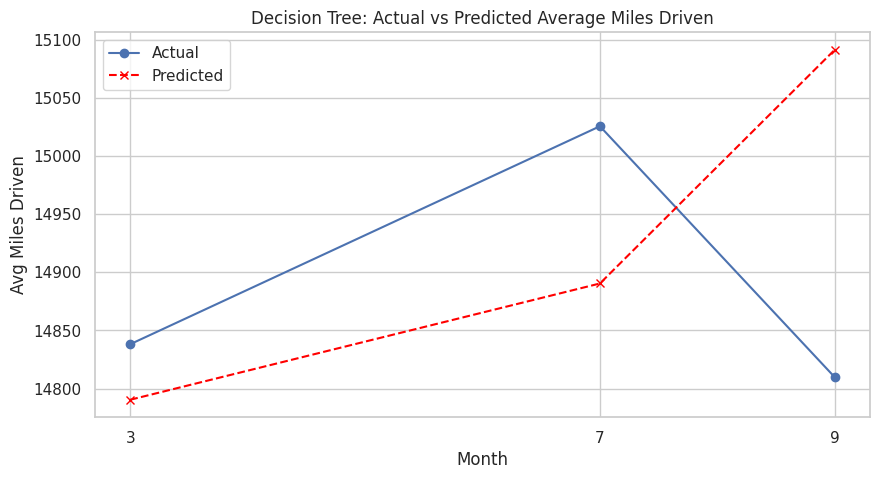

In [175]:
# Convert to Pandas DataFrame for visualization
pandas_predictions = predictions.toPandas()

# Plot actual vs. predicted values
plt.figure(figsize=(10, 5))
plt.plot(pandas_predictions['Month'], pandas_predictions['Avg_Miles_Driven'], marker='o', label='Actual')
plt.plot(pandas_predictions['Month'], pandas_predictions['prediction'], marker='x', linestyle='--', color='red', label='Predicted')
plt.xlabel('Month')
plt.ylabel('Avg Miles Driven')
plt.title('Decision Tree: Actual vs Predicted Average Miles Driven')
plt.xticks(pandas_predictions['Month'])
plt.grid(True)
plt.legend()
plt.show()

In [176]:
from pyspark.ml.regression import RandomForestRegressor

# Initialize Random Forest Regressor
rf = RandomForestRegressor(featuresCol='features', labelCol='Avg_Miles_Driven', numTrees=100)

# Fit the model
rf_model = rf.fit(train_data)

# Make predictions
rf_predictions = rf_model.transform(test_data)

# Evaluate using RMSE and R-squared
rf_rmse = rmse_evaluator.evaluate(rf_predictions)
rf_r2 = r2_evaluator.evaluate(rf_predictions)

print(f"Random Forest RMSE: {rf_rmse}")
print(f"Random Forest R-squared: {rf_r2}")


24/10/26 18:06:23 WARN DecisionTreeMetadata: DecisionTree reducing maxBins from 32 to 9 (= number of training instances)


Random Forest RMSE: 188.1959382087686
Random Forest R-squared: -2.8575737704245743


In [177]:
from pyspark.ml.regression import GBTRegressor

# Initialize Gradient-Boosted Trees Regressor
gbt = GBTRegressor(featuresCol='features', labelCol='Avg_Miles_Driven', maxIter=50)

# Fit the model
gbt_model = gbt.fit(train_data)

# Make predictions
gbt_predictions = gbt_model.transform(test_data)

# Evaluate using RMSE and R-squared
gbt_rmse = rmse_evaluator.evaluate(gbt_predictions)
gbt_r2 = r2_evaluator.evaluate(gbt_predictions)

print(f"GBT RMSE: {gbt_rmse}")
print(f"GBT R-squared: {gbt_r2}")


24/10/26 18:06:37 WARN DecisionTreeMetadata: DecisionTree reducing maxBins from 32 to 9 (= number of training instances)


GBT RMSE: 187.94872850307053
GBT R-squared: -2.8474459923976756


### Seasonal Impact on Claims

In [181]:
from pyspark.sql.functions import month

# Extract month from the Timestamp to analyze seasonal effects
telematics_data = telematics_data.withColumn("Month", month(telematics_data["Timestamp"]))

# Select relevant features for seasonal analysis
seasonal_data = telematics_data.select("Month", "Weather Conditions (%)", "Temperature (°C)", "Number of Claims")

# Show the first few rows to verify
seasonal_data.show(5)


+-----+----------------------+-----------------+----------------+
|Month|Weather Conditions (%)| Temperature (°C)|Number of Claims|
+-----+----------------------+-----------------+----------------+
|    4|      70.2980211317155|16.43294622859469|               0|
|   12|    15.925704730510311|15.32029329592969|               0|
|    9|    16.697620766383377|5.735761575713896|               1|
|    4|     22.32180077350789|35.84658144394592|               0|
|    3|     11.54328977759663|21.37274714400005|               0|
+-----+----------------------+-----------------+----------------+
only showing top 5 rows



In [182]:
from pyspark.ml.feature import VectorAssembler

# Define the input features for the model
assembler = VectorAssembler(
    inputCols=["Weather Conditions (%)", "Temperature (°C)", "Month"],
    outputCol="features"
)

# Transform the data into feature vectors
feature_data = assembler.transform(seasonal_data).select("features", "Number of Claims")
feature_data.show(5)


+--------------------+----------------+
|            features|Number of Claims|
+--------------------+----------------+
|[70.2980211317155...|               0|
|[15.9257047305103...|               0|
|[16.6976207663833...|               1|
|[22.3218007735078...|               0|
|[11.5432897775966...|               0|
+--------------------+----------------+
only showing top 5 rows



In [183]:
# Split the data into training and test sets
train_data, test_data = feature_data.randomSplit([0.8, 0.2], seed=42)


In [184]:
from pyspark.ml.regression import LinearRegression

# Initialize the Linear Regression model
lr = LinearRegression(featuresCol="features", labelCol="Number of Claims", predictionCol="prediction")

# Train the model
lr_model = lr.fit(train_data)

# Print model coefficients and intercept
print(f"Coefficients: {lr_model.coefficients}")
print(f"Intercept: {lr_model.intercept}")


24/10/26 18:09:21 WARN Instrumentation: [45db6c34] regParam is zero, which might cause numerical instability and overfitting.


Coefficients: [0.0002694542357484584,-0.00025351112373143704,-0.0001553431648651425]
Intercept: 0.2954427836332989


In [185]:
# Make predictions on the test set
predictions = lr_model.transform(test_data)

# Show predictions along with actual values
predictions.select("prediction", "Number of Claims", "features").show(5)

# Evaluate the model performance
from pyspark.ml.evaluation import RegressionEvaluator

evaluator = RegressionEvaluator(
    labelCol="Number of Claims", predictionCol="prediction", metricName="rmse"
)

# Calculate RMSE
rmse = evaluator.evaluate(predictions)
print(f"Root Mean Squared Error (RMSE) on test data = {rmse}")


+-------------------+----------------+--------------------+
|         prediction|Number of Claims|            features|
+-------------------+----------------+--------------------+
|0.28499947640097506|               0|[0.88959012388924...|
|0.29181572038747405|               0|[1.81610089001059...|
| 0.2904808512899174|               0|[2.08471868308140...|
|0.29169702581997525|               2|[2.57506713691146...|
|  0.284848729679984|               0|[2.92864690982394...|
+-------------------+----------------+--------------------+
only showing top 5 rows

Root Mean Squared Error (RMSE) on test data = 0.5422437351821771


In [187]:
predictions.show()

+--------------------+----------------+-------------------+
|            features|Number of Claims|         prediction|
+--------------------+----------------+-------------------+
|[0.88959012388924...|               0|0.28499947640097506|
|[1.81610089001059...|               0|0.29181572038747405|
|[2.08471868308140...|               0| 0.2904808512899174|
|[2.57506713691146...|               2|0.29169702581997525|
|[2.92864690982394...|               0|  0.284848729679984|
|[3.02929322221332...|               0| 0.2883746525601066|
|[3.30081257061984...|               0|0.29318360643807484|
|[3.49984555484633...|               0|0.28801009248160925|
|[4.15217599923207...|               0| 0.2918485707035427|
|[4.16292277227024...|               0|0.28821713992893133|
|[4.17490374432091...|               0| 0.2916648290413168|
|[4.23765386460182...|               0|0.28755115701603495|
|[4.34794983266836...|               1|0.29149878530190443|
|[4.89643485590808...|               0|0